<a href="https://colab.research.google.com/github/cuhkrsdi/tabloid_newspaper-image_analytics/blob/main/Image_Detection_Extraction_and_OCR(Public).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# update pillow and google cloud vision to prevent colab error (might need to restart runtime)
!pip install --user --upgrade pillow
!pip install --upgrade google-cloud-vision

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
# Download VGG Chapbooks project code repository and setup environment
import os
import sys
import tensorflow.compat.v1 as tf
import cv2
from google.colab.patches import cv2_imshow
import datetime
import json
import cv2
from google.colab import files

In [3]:
# prepare repository and libraries (might need to restart runtime)
if 'nls-chapbooks-illustrations' not in os.getcwd():
  # download and install illustration detector repository
  !git clone --recurse-submodules https://gitlab.com/vgg/nls-chapbooks-illustrations.git
  os.chdir('nls-chapbooks-illustrations/automl/efficientdet')
  !git pull origin master  # update EfficientDet code to the latest version
  !pip install -r requirements.txt
  !pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

fatal: destination path 'nls-chapbooks-illustrations' already exists and is not an empty directory.
From https://github.com/google/automl
 * branch            master     -> FETCH_HEAD
Already up to date.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-_sn2zvr3
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-_sn2zvr3
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-fsqaniql
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-fsqaniql


In [4]:
# function to check thumbnail
def show_thumbnail(img_fn, tsize=500):
  '''
  Show a thumbnail sized version of an image in Colab
  @ param image file name
  @ param default to 500
  '''
  print(img_fn)

  img = cv2.imread(img_fn)

  # check if path exists
  #print(os.path.exists(img_fn))

  # returns the current working directory
  #print(os.getcwd()) #  /home/xxxxxx

  #print(img)

  w, h, c = img.shape
  if w > tsize or h > tsize:
    if w > h:
      new_width = tsize
      new_height = int( (w/h) * new_width )
    else:
      new_height = tsize
      new_width = int( (h/w) * new_height )

    resized_img = cv2.resize( img, (new_width, new_height) )
    cv2_imshow(resized_img)
  else:
    cv2_imshow(img)

In [5]:
# the colab default directory
current_dir = "/content/" 

In [6]:
# sample images urls from link to the Tabloid Newspaper Collection
image_url1 = "https://repository.lib.cuhk.edu.hk/en/islandora/object/cuhk%3A2706982/datastream/JPG"
image_url2 = "https://repository.lib.cuhk.edu.hk/en/islandora/object/cuhk%3A2706908/datastream/JPG"
# image_url3 = "https://repository.lib.cuhk.edu.hk/en/islandora/object/cuhk%3A2707066/datastream/JPG"
# image_url4 = "https://repository.lib.cuhk.edu.hk/en/islandora/object/cuhk%3A2707002/datastream/JPG"

In [7]:
# download the above images from CUHK library repository
test_image_filename1 = 'sample1.jpg'
!wget {image_url1} -O {current_dir + test_image_filename1}
test_image_filename2 = 'sample2.jpg'
!wget {image_url2} -O {current_dir + test_image_filename2}
# test_image_filename3 = 'sample3.jpg'
# !wget {image_url3} -O {current_dir + test_image_filename3}
# test_image_filename4 = 'sample4.jpg'
# !wget {image_url4} -O {current_dir + test_image_filename4}

--2022-12-09 09:42:54--  https://repository.lib.cuhk.edu.hk/en/islandora/object/cuhk%3A2706982/datastream/JPG
Resolving repository.lib.cuhk.edu.hk (repository.lib.cuhk.edu.hk)... 52.76.157.163
Connecting to repository.lib.cuhk.edu.hk (repository.lib.cuhk.edu.hk)|52.76.157.163|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12043431 (11M) [image/jpeg]
Saving to: ‘/content/sample1.jpg’

/content/sample1.jp 100%[===================>]  11.49M  5.61MB/s    in 2.0s    

2022-12-09 09:42:57 (5.61 MB/s) - ‘/content/sample1.jpg’ saved [12043431/12043431]

--2022-12-09 09:42:57--  https://repository.lib.cuhk.edu.hk/en/islandora/object/cuhk%3A2706908/datastream/JPG
Resolving repository.lib.cuhk.edu.hk (repository.lib.cuhk.edu.hk)... 52.76.157.163
Connecting to repository.lib.cuhk.edu.hk (repository.lib.cuhk.edu.hk)|52.76.157.163|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9876255 (9.4M) [image/jpeg]
Saving to: ‘/content/sample2.jpg’

/conten

In [8]:
# read filenames into list
data = []
for filename in os.listdir(current_dir):
    if filename.endswith("jpg"): 
        data.append(filename)
data = sorted(data)

In [9]:
data

['sample1.jpg', 'sample2.jpg']

2022-12-09 09:43:02.581568: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.8/dist-packages/cv2/../../lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2022-12-09 09:43:02.581711: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.8/dist-packages/cv2/../../lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
2022-12-09 09:43:02.581735: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.
a

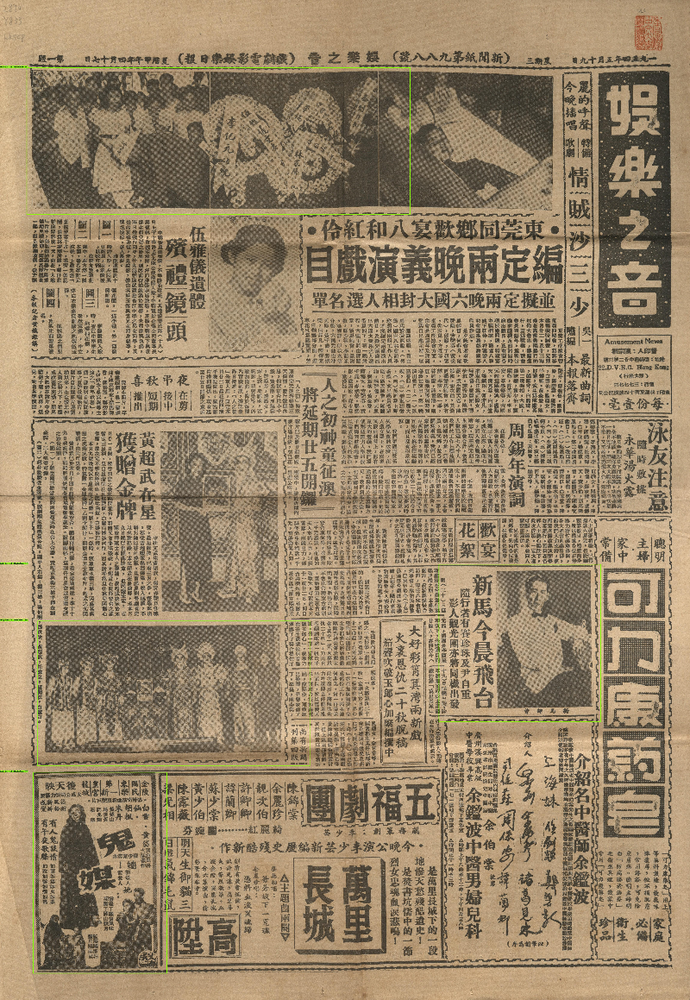

[
    {
        "file_id": "0",
        "filename": "/content/sample1.jpg",
        "early_printed_illustrations": [
            {
                "x0": 2924.0,
                "y0": 3762.0,
                "x1": 4004.0,
                "y1": 4810.0,
                "confidence": 0.845107913017273
            },
            {
                "x0": 221.0,
                "y0": 5148.0,
                "x1": 1112.0,
                "y1": 6487.0,
                "confidence": 0.6996476650238037
            },
            {
                "x0": 248.0,
                "y0": 4140.0,
                "x1": 2064.0,
                "y1": 5105.0,
                "confidence": 0.5584039688110352
            },
            {
                "x0": 177.0,
                "y0": 452.0,
                "x1": 2733.0,
                "y1": 1428.0,
                "confidence": 0.5068441033363342
            }
        ]
    }
]
Detected number of images:  4
2924 3762 1080 1068
221 5148 891 1359
248 4140 18

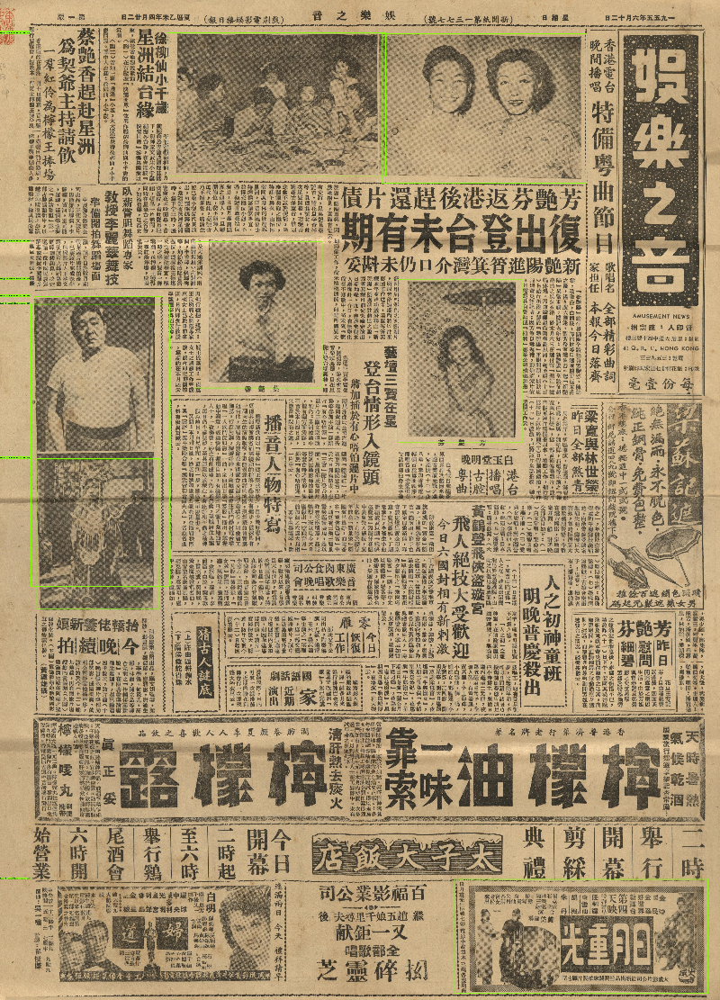

[
    {
        "file_id": "0",
        "filename": "/content/sample2.jpg",
        "early_printed_illustrations": [
            {
                "x0": 1042.0,
                "y0": 206.0,
                "x1": 2412.0,
                "y1": 1103.0,
                "confidence": 0.9631451964378357
            },
            {
                "x0": 2485.0,
                "y0": 1751.0,
                "x1": 3266.0,
                "y1": 2770.0,
                "confidence": 0.8619932532310486
            },
            {
                "x0": 213.0,
                "y0": 1857.0,
                "x1": 1021.0,
                "y1": 2873.0,
                "confidence": 0.816639244556427
            },
            {
                "x0": 1213.0,
                "y0": 1514.0,
                "x1": 2016.0,
                "y1": 2428.0,
                "confidence": 0.8135614991188049
            },
            {
                "x0": 230.0,
                "y0": 2871.0,
                "x1":

In [10]:
DET_DIR = "/content/test_output/detected" # store detected coordinates on original image
if not os.path.exists(DET_DIR):
  os.makedirs(DET_DIR)

log_dict = dict()

for url in data:

  test_image_path = os.path.join("/content/", url)

  # show_thumbnail(test_image_path) # show original image

  # Apply illustration detector to test image
  os.chdir('/content/nls-chapbooks-illustrations/tools')
  !PYTHONPATH=/content/nls-chapbooks-illustrations/automl/efficientdet/ python detect-illustration.py \
    --model-name=efficientdet-d0 \
    --saved-model-dir=/content/nls-chapbooks-illustrations/data/efficientdet/saved_model/v1/  \
    --hparams=/content/nls-chapbooks-illustrations/data/efficientdet/hparams.yaml \
    --input-image={test_image_path} \
    --output-image-dir={DET_DIR} \
    --output-json-fn={DET_DIR}/metadata.json

  img = cv2.imread(os.path.join("/content/", url))  # get from original directory, and changed to url

  # Show detection results
  !ls -l {DET_DIR} # check if successfully stored the highlighted image to the DET directory 

  print("____________________________________________________________________________________________________________________________________________________") # line break for easier view

  show_thumbnail( os.path.join(DET_DIR, url), tsize=800 )   # show image with detected boundaries 


  with open( os.path.join(DET_DIR, 'metadata.json'), 'r' ) as f:
    d = json.load(f)
    print( json.dumps(d, indent=4) )
    d = d[0]['early_printed_illustrations']  
    print("Detected number of images: ", len(d))
    count = 0   # count for result illustration per image
    for i in d:
      x = int(i['x0'])
      y = int(i['y0'])
      w = int(i['x1'] - i['x0'])
      h = int(i['y1'] - i['y0']) + 20
      confidence = i["confidence"]
      print(x,y,w,h)


      crop_img = img[y:y+h, x:x+w] # crop image from detected coordinates 


      raw_filename = url[:-4]
      fname = 'output_'+ raw_filename + '_' + str(count)+'.jpg'

      if filename not in log_dict:
        log_dict[fname] = [x, y, w, h, confidence, url]  # should be unique record for each

      if not os.path.exists(f"/content/Batch/"):
        os.makedirs(f"/content/Batch/")

      cv2.imwrite(os.path.join(f"/content/Batch/", fname), crop_img)
      count = count+1

print(log_dict)
with open(f'/content/output_log.json', 'w') as fp:
    json.dump(log_dict, fp)


In [11]:
# log detected boundaries of illustrations 
log_dict

{'output_sample1_0.jpg': [2924,
  3762,
  1080,
  1068,
  0.845107913017273,
  'sample1.jpg'],
 'output_sample1_1.jpg': [221,
  5148,
  891,
  1359,
  0.6996476650238037,
  'sample1.jpg'],
 'output_sample1_2.jpg': [248,
  4140,
  1816,
  985,
  0.5584039688110352,
  'sample1.jpg'],
 'output_sample1_3.jpg': [177,
  452,
  2556,
  996,
  0.5068441033363342,
  'sample1.jpg'],
 'output_sample2_0.jpg': [1042,
  206,
  1370,
  917,
  0.9631451964378357,
  'sample2.jpg'],
 'output_sample2_1.jpg': [2485,
  1751,
  781,
  1039,
  0.8619932532310486,
  'sample2.jpg'],
 'output_sample2_2.jpg': [213,
  1857,
  808,
  1036,
  0.816639244556427,
  'sample2.jpg'],
 'output_sample2_3.jpg': [1213,
  1514,
  803,
  934,
  0.8135614991188049,
  'sample2.jpg'],
 'output_sample2_4.jpg': [230,
  2871,
  766,
  958,
  0.6692922115325928,
  'sample2.jpg'],
 'output_sample2_5.jpg': [2842,
  5505,
  1587,
  731,
  0.5779596567153931,
  'sample2.jpg'],
 'output_sample2_6.jpg': [193,
  1905,
  867,
  1784,
  0.52

Result images OCR

In [12]:
# LOCAL IMAGE

def detect_text(path, filename, google_vision_api_json):
    """
    Detects text in the file.
    @param path of current file including directory
    @param filename only the file name with file extension
    @param google vision api json user's own Google Vision Api generated
    @return dictionary of list, generated int start from 0 as key, value is list which contain the OCR text and correspondent coordinate on the oringal image
    """
    from google.cloud import vision
    import io


    from google.oauth2 import service_account

    credentials = service_account.Credentials.from_service_account_file(google_vision_api_json)

    client = vision.ImageAnnotatorClient(credentials=credentials)
    # client = vision.ImageAnnotatorClient()

    with io.open(path, 'rb') as image_file:
        content = image_file.read()

    image = vision.Image(content=content)

    response = client.text_detection(image=image)
    texts = response.text_annotations
    print('Texts:')
    # print(type(texts))


    for text in texts:
        print('\n"{}"'.format(text.description))

        vertices = (['({},{})'.format(vertex.x, vertex.y)
                    for vertex in text.bounding_poly.vertices])

        print('bounds: {}'.format(','.join(vertices)))

    if response.error.message:
        raise Exception(
            '{}\nFor more info on error messages, check: '
            'https://cloud.google.com/apis/design/errors'.format(
                response.error.message))
        


    # store result to dictionary and return 
    ocr_result = dict()
    count = 0
    # structure the string
    for text in texts:

      main_text = '\n"{}"'.format(text.description)

      vertices = (['({},{})'.format(vertex.x, vertex.y)
                    for vertex in text.bounding_poly.vertices])
      
      verticies_text = 'bounds: {}'.format(','.join(vertices))

      ocr_result[count] = [main_text, verticies_text]
      count += 1

    return ocr_result

In [13]:
result_imgs = []

result_imgs_dir = "/content/Batch/"
for filename in os.listdir(result_imgs_dir):
    if filename.endswith("jpg"): 
        result_imgs.append(filename)
result_imgs = sorted(result_imgs)

In [14]:
result_imgs

['output_sample1_0.jpg',
 'output_sample1_1.jpg',
 'output_sample1_2.jpg',
 'output_sample1_3.jpg',
 'output_sample2_0.jpg',
 'output_sample2_1.jpg',
 'output_sample2_2.jpg',
 'output_sample2_3.jpg',
 'output_sample2_4.jpg',
 'output_sample2_5.jpg',
 'output_sample2_6.jpg']

In [15]:
# !!!Please upload your own Google Cloud Vision API Key and replace the json filename!!!
# Follow the steps in https://cloud.google.com/vision/docs/setup#sa-create to make you own API key in JSON

google_vision_api_json = '/content/my-project-26092022-dbcabafcc0ff.json'

/content/Batch/output_sample1_0.jpg


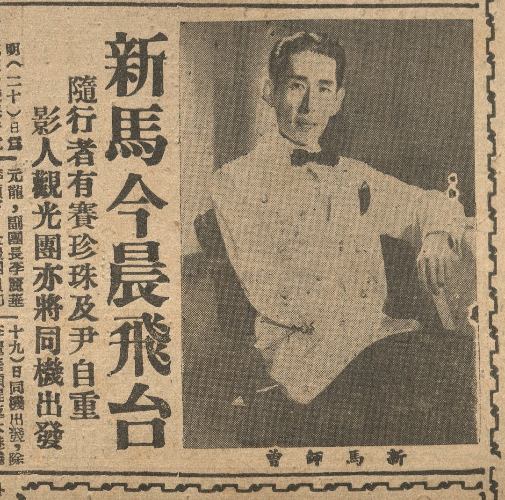

Texts:

"NLNLOAN
曾師馬新
新馬今晨飛台
隨行者有賽珍珠及尹自重
影人觀光團亦將同機出發
明《二十日爲 元龍,副團長李麗華 十九)日同機出發,除"
bounds: (5,65),(1069,65),(1069,1006),(5,1006)

"NLNLOAN"
bounds: (1066,603),(1070,980),(1047,980),(1043,603)

"曾"
bounds: (563,960),(608,960),(608,996),(563,996)

"師"
bounds: (646,960),(692,960),(692,996),(646,996)

"馬"
bounds: (734,960),(781,960),(781,996),(734,996)

"新"
bounds: (822,960),(875,960),(875,996),(822,996)

"新馬今"
bounds: (200,67),(352,66),(355,510),(203,511)

"晨飛"
bounds: (203,527),(355,526),(357,809),(205,810)

"台"
bounds: (205,740),(357,739),(359,1004),(207,1005)

"隨行"
bounds: (132,156),(207,156),(207,285),(132,285)

"者"
bounds: (132,296),(207,296),(207,359),(132,359)

"有"
bounds: (132,363),(207,363),(207,424),(132,424)

"賽珍珠"
bounds: (132,429),(208,429),(209,626),(133,626)

"及"
bounds: (133,621),(208,621),(208,688),(133,688)

"尹"
bounds: (133,680),(208,680),(208,765),(133,765)

"自重"
bounds: (134,751),(209,751),(210,895),(135,895)

"影"
bounds: (60,217),(129,216),(130,290),(61,291)

"人"
boun

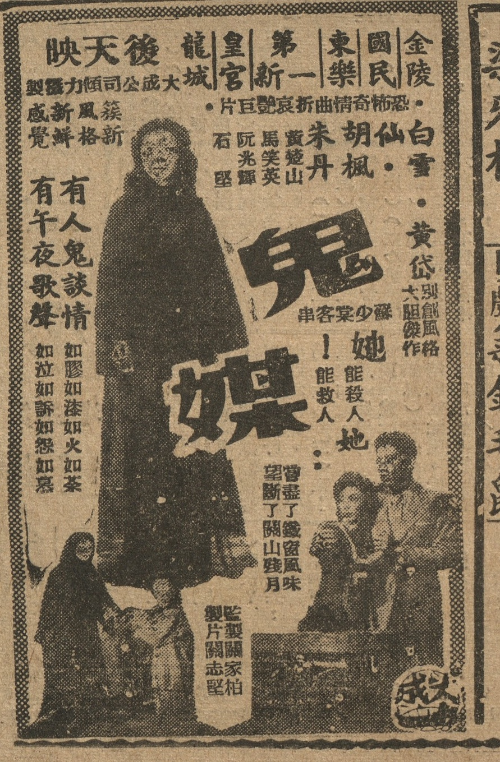

Texts:

"映天後 龍|第||
製櫃力傾司公成大城宮新一樂民陸
感新風簇
・片巨記哀折曲情奇怖恐。
覺鮮格新
有有
个人
夜鬼
歌談
聲情
石阮黃胡仙白
光笑楚
堅龙丹楓·雪
鬼
媒
望愛
斷盡
製片關志堅
監製關家柏
串客棠少蘇
堅柏
味
雪·黄岱關儲
!她作格
能能
救殺
6"
bounds: (37,39),(896,39),(896,1242),(37,1242)

"映"
bounds: (78,60),(146,58),(148,116),(80,118)

"天後"
bounds: (142,57),(283,53),(285,112),(144,116)

"龍"
bounds: (317,52),(380,50),(382,108),(319,110)

"|"
bounds: (441,49),(451,49),(453,107),(443,107)

"第"
bounds: (483,48),(527,47),(529,105),(485,106)

"||"
bounds: (633,43),(713,41),(715,99),(635,101)

"製"
bounds: (46,127),(76,126),(78,180),(48,181)

"櫃"
bounds: (77,125),(111,124),(113,178),(79,179)

"力"
bounds: (113,124),(144,123),(146,177),(115,178)

"傾"
bounds: (148,122),(180,121),(182,175),(150,176)

"司"
bounds: (179,121),(211,120),(213,174),(181,175)

"公"
bounds: (215,120),(247,119),(249,173),(217,174)

"成"
bounds: (247,118),(283,117),(285,171),(249,172)

"大城"
bounds: (286,116),(374,112),(376,167),(288,171)

"宮"
bounds: (387,113),(437,111),(439,165),(389,167)

"新"
bounds: (449,110),(503,108)

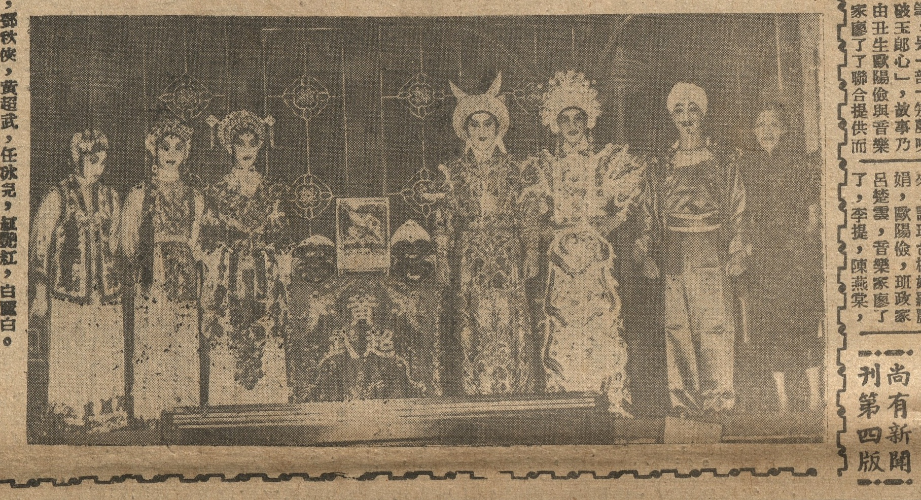

Texts:

"WA
THU
H
破玉郎心」,故事乃 娟,歐陽儉,班政家
由生歐陽儉與音樂 呂楚,音樂家應了
家應了了聯合提供而了,李提,陳燕棠,
Cat of
Gold
,鄧秋俠,黄超武,任冰兒,紅艷紅,白麗白。
【尚有新聞
刊第四版
~ AN"
bounds: (-8,0),(1815,0),(1815,930),(-8,930)

"WA"
bounds: (1801,102),(1801,74),(1814,74),(1814,102)

"THU"
bounds: (1816,129),(1816,164),(1802,164),(1802,129)

"H"
bounds: (1803,440),(1813,440),(1813,458),(1803,458)

"破"
bounds: (1758,2),(1794,2),(1794,40),(1758,40)

"玉郎"
bounds: (1758,37),(1794,37),(1794,101),(1758,101)

"心"
bounds: (1758,108),(1794,108),(1794,134),(1758,134)

"」"
bounds: (1758,146),(1794,146),(1794,157),(1758,157)

","
bounds: (1758,179),(1794,179),(1794,193),(1758,193)

"故事"
bounds: (1758,201),(1794,201),(1794,269),(1758,269)

"乃"
bounds: (1758,266),(1794,266),(1794,304),(1758,304)

"娟"
bounds: (1759,329),(1795,329),(1795,371),(1759,371)

","
bounds: (1759,382),(1795,382),(1795,394),(1759,394)

"歐陽"
bounds: (1759,402),(1795,402),(1795,475),(1759,475)

"儉"
bounds: (1759,465),(1795,465),(1795,510),(1759,510)

","
bounds: (1759,518),(1795,518),(

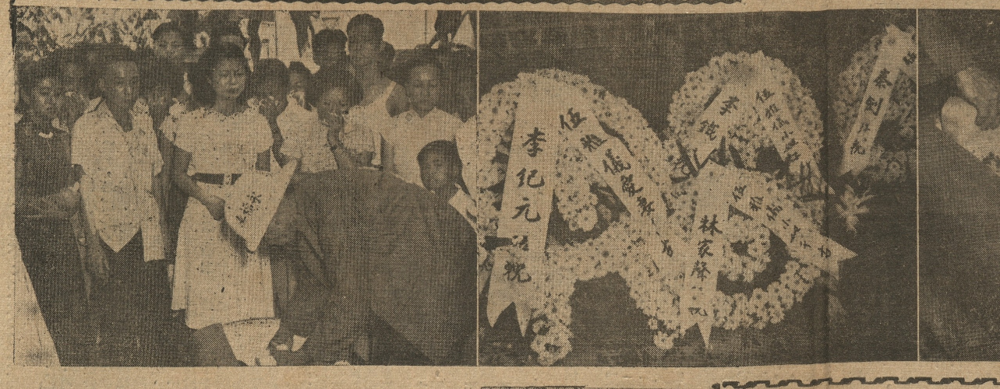

Texts:

"的燒
李亿元
纪
锐
伍儀愛
Y
任
秦劍 格
LARAFLOLU"
bounds: (593,139),(2514,139),(2514,983),(593,983)

"的"
bounds: (637,470),(671,488),(643,540),(609,522)

"燒"
bounds: (617,508),(651,526),(628,569),(594,551)

"李"
bounds: (1329,317),(1403,325),(1391,435),(1317,427)

"亿元"
bounds: (1318,414),(1392,422),(1375,576),(1301,568)

"纪"
bounds: (1316,428),(1392,431),(1390,481),(1314,478)

"锐"
bounds: (1285,667),(1364,672),(1361,722),(1282,717)

"伍"
bounds: (1414,307),(1463,264),(1516,324),(1467,367)

"儀"
bounds: (1506,410),(1555,367),(1624,445),(1576,489)

"愛"
bounds: (1550,459),(1599,416),(1660,485),(1611,528)

"Y"
bounds: (1685,612),(1716,616),(1711,652),(1680,648)

"任"
bounds: (1922,246),(1967,216),(1984,241),(1938,271)

"秦"
bounds: (2246,139),(2276,149),(2239,261),(2209,251)

"劍"
bounds: (2222,213),(2252,223),(2219,323),(2189,313)

"格"
bounds: (2186,319),(2216,329),(2184,427),(2154,417)

"LARAFLOLU"
bounds: (2208,962),(2514,963),(2514,983),(2208,982)
/content/Batch/output_sample2_0.jpg


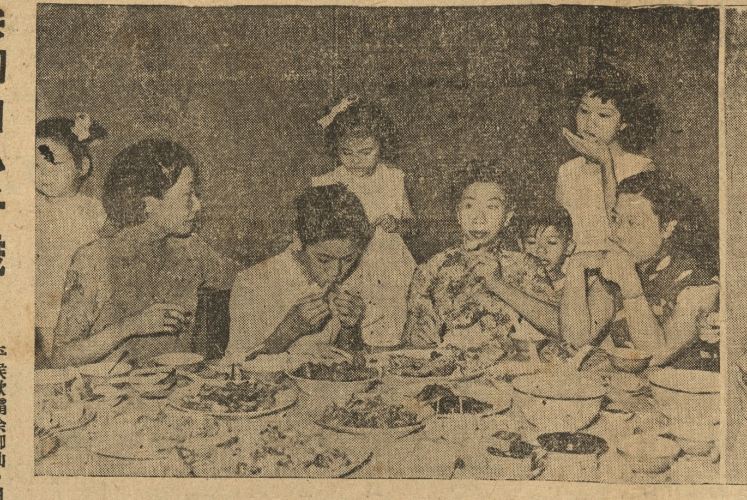

Texts:
/content/Batch/output_sample2_1.jpg


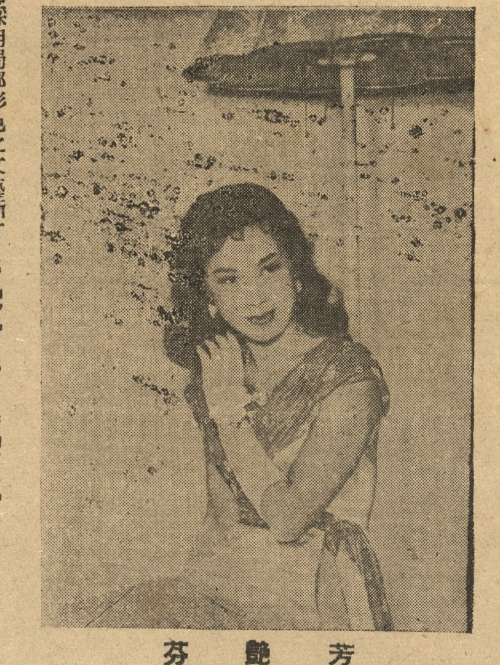

Texts:

"F
芬艷 芳"
bounds: (252,239),(555,239),(555,1040),(252,1040)

"F"
bounds: (315,239),(341,242),(338,263),(312,260)

"芬"
bounds: (252,1001),(295,1001),(295,1037),(252,1037)

"艷"
bounds: (381,1001),(422,1001),(422,1037),(381,1037)

"芳"
bounds: (507,1004),(555,1004),(555,1040),(507,1040)
/content/Batch/output_sample2_2.jpg


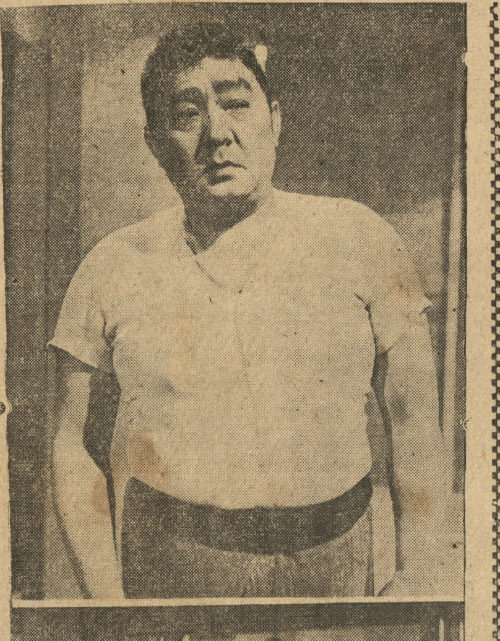

Texts:
/content/Batch/output_sample2_3.jpg


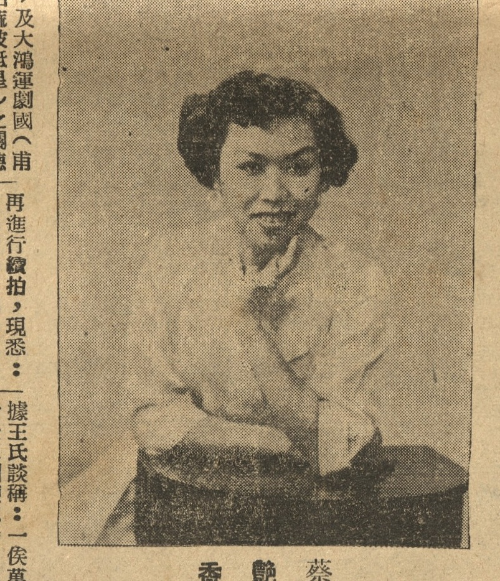

Texts:

"香艷葵
–及大鴻運劇國(甫 再進行續拍,現悉:「據王氏談稱:一萬"
bounds: (-2,-5),(536,-5),(536,945),(-2,945)

"香艷"
bounds: (314,903),(442,900),(443,935),(315,938)

"葵"
bounds: (486,899),(535,898),(536,933),(487,934)

"–"
bounds: (12,-5),(55,-4),(55,6),(12,5)

"及"
bounds: (11,11),(54,12),(54,46),(11,45)

"大"
bounds: (11,48),(54,49),(54,78),(11,77)

"鴻運"
bounds: (10,76),(53,77),(52,145),(9,144)

"劇"
bounds: (10,133),(53,134),(52,179),(9,178)

"國"
bounds: (9,171),(52,172),(51,210),(8,209)

"("
bounds: (8,217),(51,218),(51,231),(8,230)

"甫"
bounds: (8,239),(51,240),(51,276),(8,275)

"再"
bounds: (7,306),(50,307),(50,342),(7,341)

"進行"
bounds: (6,341),(50,342),(49,409),(5,408)

"續"
bounds: (6,411),(49,412),(49,448),(6,447)

"拍"
bounds: (5,437),(48,438),(47,476),(4,475)

","
bounds: (5,482),(48,483),(48,502),(5,501)

"現"
bounds: (5,507),(48,508),(48,543),(5,542)

"悉"
bounds: (4,543),(47,544),(47,571),(4,570)

":"
bounds: (4,582),(47,583),(47,606),(4,605)

"「"
bounds: (3,627),(46,628),(46,633),(3,632)

"據"
bounds: 

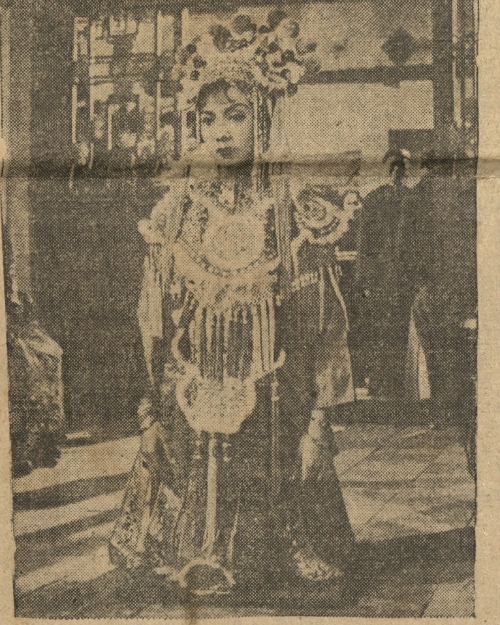

Texts:

"À"
bounds: (597,231),(645,231),(645,283),(597,283)

"À"
bounds: (597,232),(644,231),(645,282),(598,283)
/content/Batch/output_sample2_5.jpg


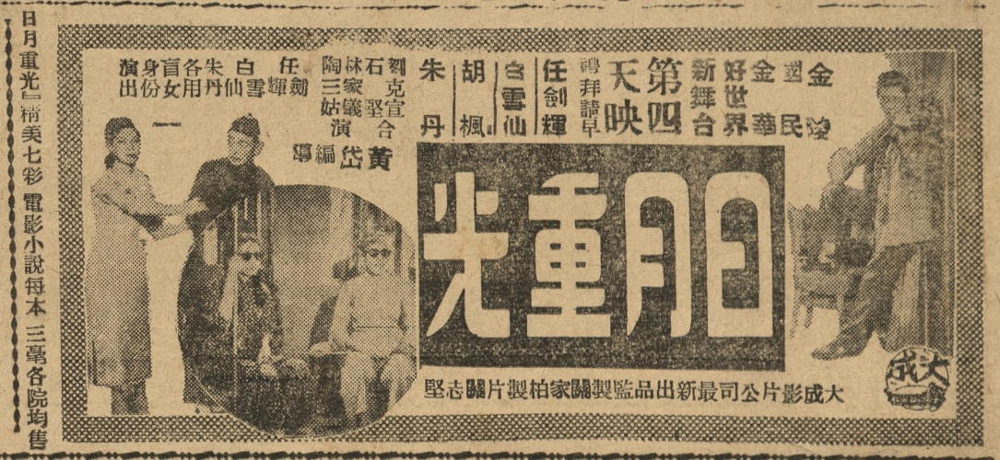

Texts:

"1日月重光』祈美七彩 電影小說每本 三各院均售 m
演身盲各朱 白任。陶林石朱| 3|
份女用丹仙雪輝劍 三家 克
天
天第
演丹 楓仙 輝豐映四台界華民
申編岱黃
先重日
堅志關片製柏家關製監品出新最司公片影成大
第新好金國金
成大"
bounds: (23,-1),(1508,-1),(1508,748),(23,748)

"1"
bounds: (24,0),(59,-1),(59,7),(24,8)

"日月"
bounds: (24,20),(59,19),(60,75),(25,76)

"重"
bounds: (25,80),(60,79),(61,109),(26,110)

"光"
bounds: (26,112),(61,111),(62,142),(27,143)

"』"
bounds: (27,145),(62,144),(62,158),(27,159)

"祈"
bounds: (27,163),(62,162),(63,193),(28,194)

"美"
bounds: (28,193),(63,192),(64,230),(29,231)

"七彩"
bounds: (28,228),(63,227),(65,297),(30,298)

"電影"
bounds: (30,306),(66,305),(68,377),(32,378)

"小說"
bounds: (32,372),(67,371),(68,439),(33,440)

"每"
bounds: (33,435),(68,434),(69,473),(34,474)

"本"
bounds: (34,469),(69,468),(70,505),(35,506)

"三"
bounds: (35,513),(70,512),(71,546),(36,547)

"各"
bounds: (36,576),(71,575),(72,613),(37,614)

"院"
bounds: (37,608),(72,607),(73,647),(38,648)

"均"
bounds: (38,645),(73,644),(74,679),(39,680)

"售"
bounds: (38,676),(73,675),(74,715),(39,716)

"

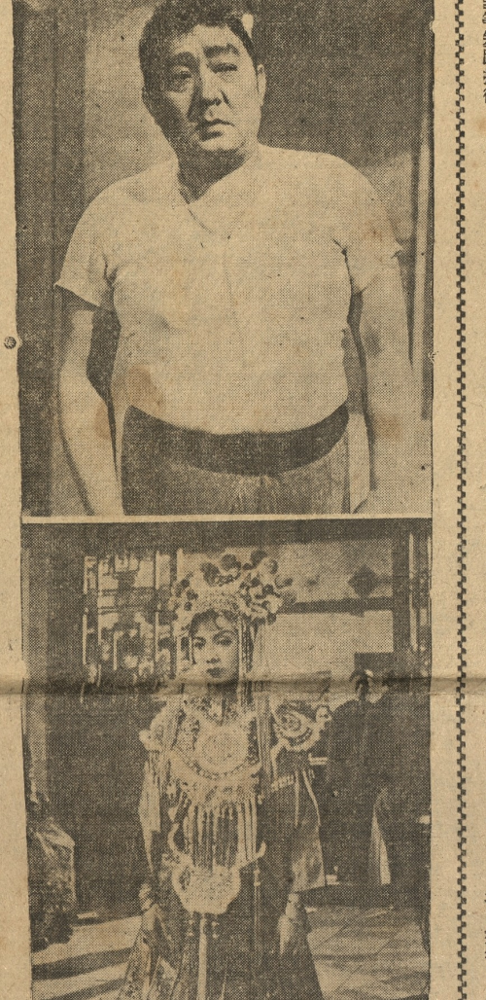

Texts:

"ជំង
| r"
bounds: (222,978),(379,978),(379,1215),(222,1215)

"ជំ"
bounds: (227,1079),(286,1079),(286,1215),(227,1215)

"ង"
bounds: (324,1079),(379,1079),(379,1215),(324,1215)

"|"
bounds: (285,1075),(265,1076),(263,981),(283,980)

"r"
bounds: (253,1075),(226,1076),(224,981),(251,980)


In [17]:
for img in result_imgs:
  show_thumbnail(result_imgs_dir + img)
  text_dict = detect_text(result_imgs_dir + img, img, google_vision_api_json)

  filename = img[0:-3]

  json_filename = result_imgs_dir + filename + "json"
  with open(json_filename, 'w') as fp:
      json.dump(text_dict, fp)


In [ ]:
!zip -r /content/Batch.zip /content/Batch

files.download("/content/Batch.zip")